TensorFlow Version: 2.19.0
Memulai proses mounting Google Drive...
Mounted at /content/drive
Direktori kerja ditemukan: /content/drive/MyDrive/Colab Notebooks/Deep Learning Lanjut/Natural Style 2

File yang tersedia di direktori:
 - style_image.jpg
 - content_image.jpg
Sedang memuat gambar...


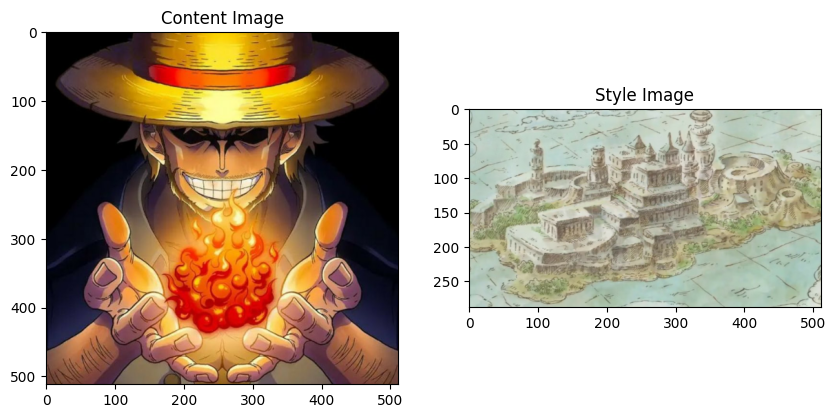

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

Memulai Training untuk 10 epoch...
Epoch 1/10
....................................................................................................



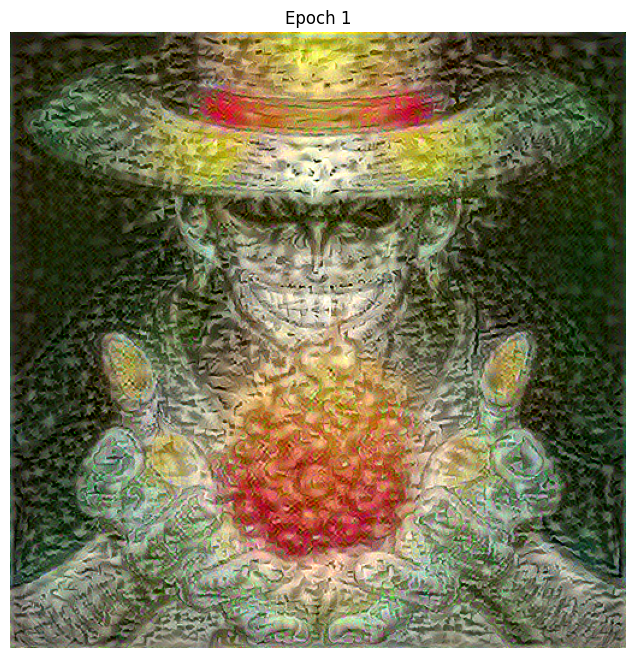

Epoch 2/10
....................................................................................................



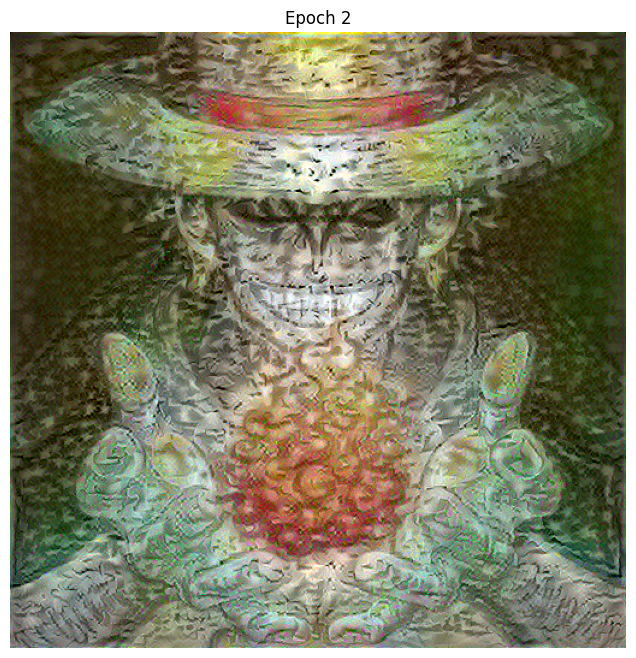

Epoch 3/10
....................................................................................................



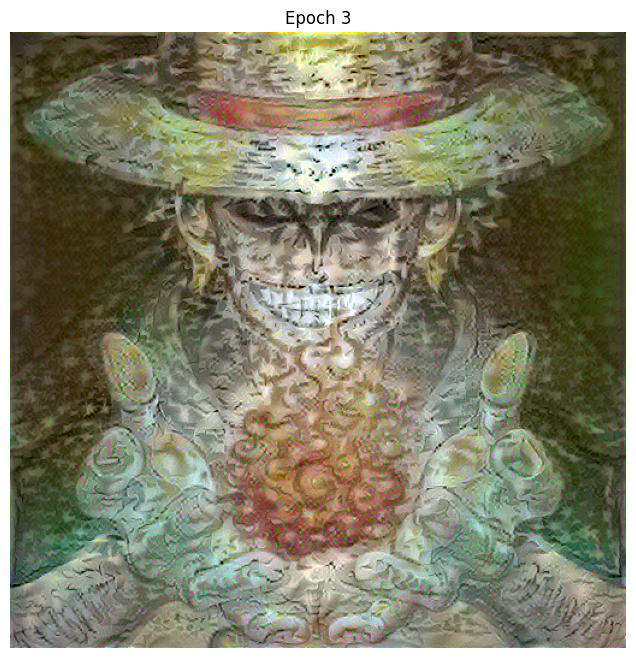

Epoch 4/10
....................................................................................................



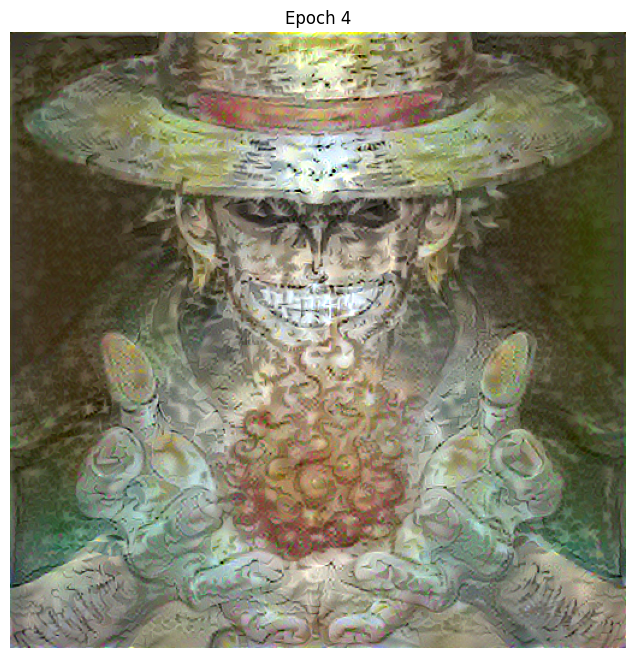

Epoch 5/10
....................................................................................................



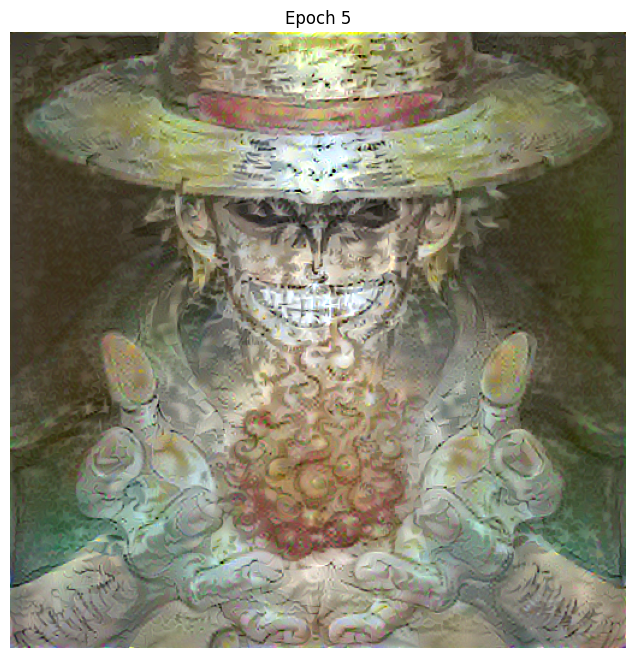

Epoch 6/10
....................................................................................................



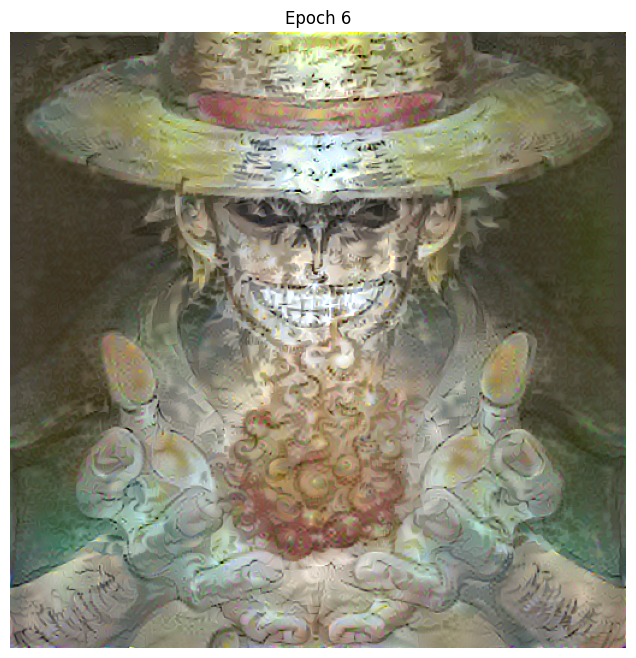

Epoch 7/10
....................................................................................................



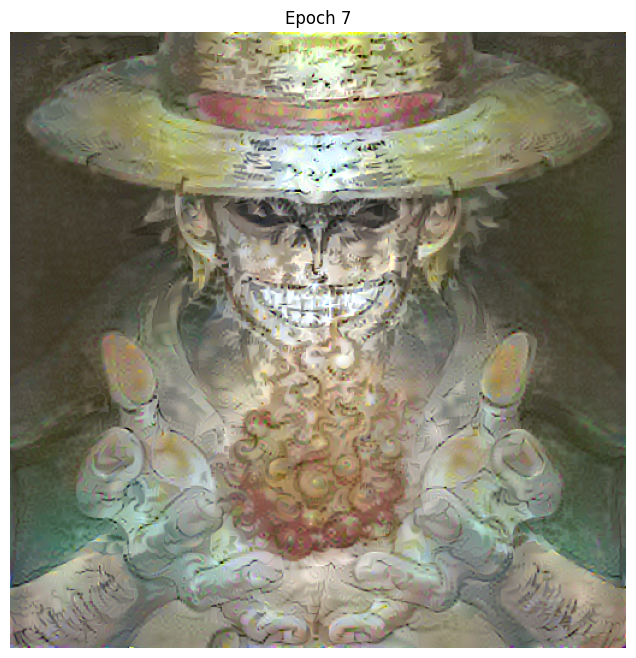

Epoch 8/10
....................................................................................................



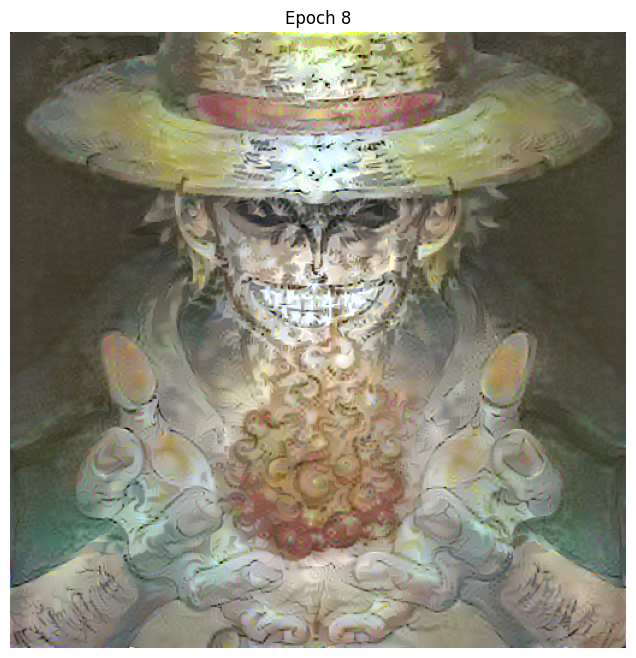

Epoch 9/10
....................................................................................................



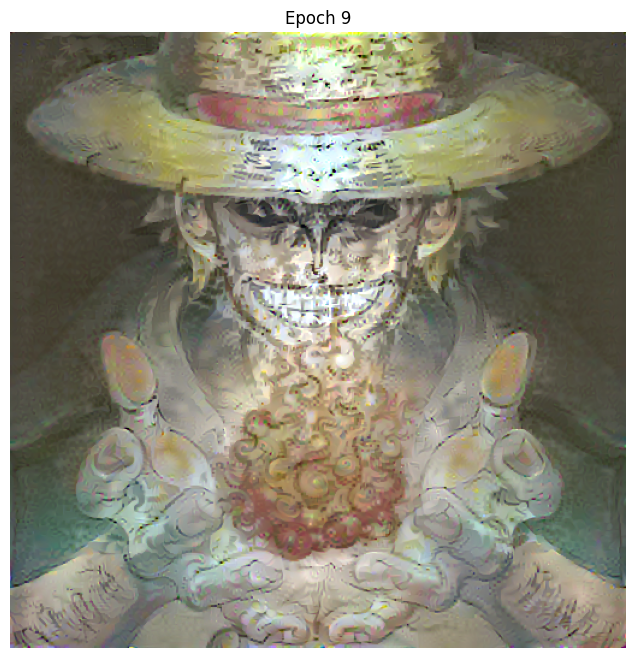

Epoch 10/10
....................................................................................................



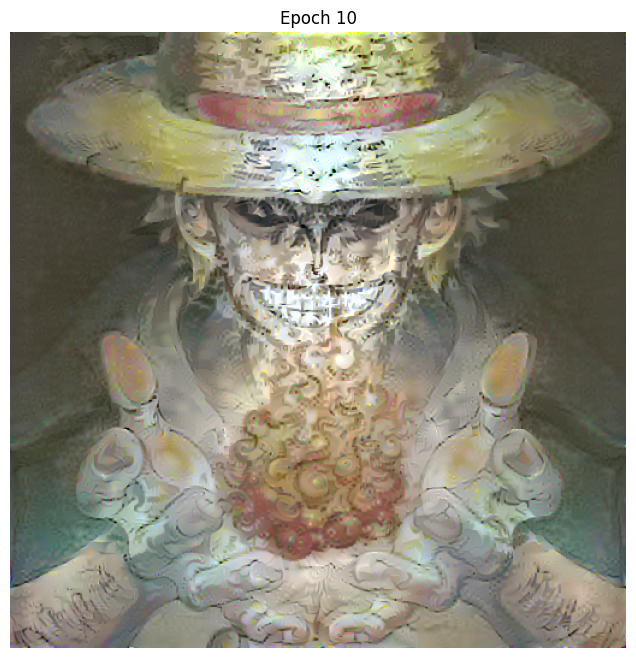

Total time: 97.7 seconds

Hasil tersimpan di: /content/drive/MyDrive/Colab Notebooks/Deep Learning Lanjut/Natural Style 2/result_stylized.jpg


In [1]:
"""
Advanced Neural Style Transfer (NST) Implementation
Architecture: VGG19 (Pre-trained on ImageNet)
Author: Husni Mubarok
Context: Deep Learning Lanjut
"""

import os
import tensorflow as tf
import numpy as np
import PIL.Image
import matplotlib.pyplot as plt
import time
from google.colab import drive

# ==========================================
# 1. SETUP & KONFIGURASI PATH (CRITICAL)
# ==========================================

print(f"TensorFlow Version: {tf.__version__}")
print("Memulai proses mounting Google Drive...")

# Mount Google Drive
drive.mount('/content/drive')

# Konfigurasi Path sesuai permintaan
WORKING_DIR = '/content/drive/MyDrive/Colab Notebooks/Deep Learning Lanjut/Natural Style 2'

# Cek keberadaan direktori
if not os.path.exists(WORKING_DIR):
    print(f"PERINGATAN: Path {WORKING_DIR} tidak ditemukan.")
    print("Membuat direktori baru untuk mencegah error...")
    os.makedirs(WORKING_DIR, exist_ok=True)
else:
    print(f"Direktori kerja ditemukan: {WORKING_DIR}")

# Menampilkan file yang ada di folder tersebut untuk verifikasi
print("\nFile yang tersedia di direktori:")
files = os.listdir(WORKING_DIR)
for f in files:
    print(f" - {f}")

# ==========================================
# 2. PARAMETER EKSPERIMEN (HYPERPARAMETERS)
# ==========================================

# Ganti nama file ini sesuai dengan file yang ada di folder Anda
CONTENT_IMAGE_NAME = 'content_image.jpg'  # Diperbarui sesuai log direktori Anda
STYLE_IMAGE_NAME = 'style_image.jpg'      # Diperbarui sesuai log direktori Anda

CONTENT_PATH = os.path.join(WORKING_DIR, CONTENT_IMAGE_NAME)
STYLE_PATH = os.path.join(WORKING_DIR, STYLE_IMAGE_NAME)

# Parameter Resolusi
IMG_MAX_DIM = 512 # Mengurangi dimensi jika GPU memory terbatas, naikkan ke 1024 jika menggunakan GPU High-RAM

# Bobot Loss (Weighting) - Area penelitian untuk tuning
CONTENT_WEIGHT = 1e4  # Seberapa kuat mempertahankan bentuk asli
STYLE_WEIGHT = 1e-2   # Seberapa kuat mengaplikasikan gaya artistik
TOTAL_VARIATION_WEIGHT = 30  # Untuk menghaluskan noise (denoising)

EPOCHS = 10
STEPS_PER_EPOCH = 100

# ==========================================
# 3. UTILITAS PEMROSESAN CITRA
# ==========================================

def tensor_to_image(tensor):
    """Mengubah tensor kembali menjadi gambar standar untuk visualisasi."""
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
    """
    Memuat gambar dan mengubah ukurannya agar dimensi maksimalnya adalah IMG_MAX_DIM.
    Membaca file raw, decode jpeg, convert ke float32.
    """
    try:
        max_dim = IMG_MAX_DIM
        img = tf.io.read_file(path_to_img)
        img = tf.image.decode_image(img, channels=3)
        img = tf.image.convert_image_dtype(img, tf.float32)

        shape = tf.cast(tf.shape(img)[:-1], tf.float32)
        long_dim = max(shape)
        scale = max_dim / long_dim

        new_shape = tf.cast(shape * scale, tf.int32)

        img = tf.image.resize(img, new_shape)
        img = img[tf.newaxis, :] # Menambah batch dimension
        return img
    except Exception as e:
        print(f"Error saat memuat gambar di path: {path_to_img}")
        print(f"Pastikan file '{os.path.basename(path_to_img)}' ada di folder Google Drive yang ditentukan.")
        raise e

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)

# ==========================================
# 4. DEFINISI MODEL VGG19 & LAYER SELECTIONS
# ==========================================

# Kita menggunakan VGG19 pretrained ImageNet.
# Layer konten biasanya dipilih dari layer yang lebih dalam (high-level features).
# Layer style dipilih dari kombinasi layer awal hingga dalam (texture & patterns).

content_layers = ['block5_conv2']

style_layers = [
    'block1_conv1',
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1'
]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

def vgg_layers(layer_names):
    """ Memuat VGG19 dan mengambil output dari layer spesifik """
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.vgg.trainable = False

    def call(self, inputs):
        # Input diharapkan berupa float [0,1], kita ubah ke [0,255] untuk preprocessing VGG
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)

        style_outputs, content_outputs = (outputs[:len(self.style_layers)],
                                          outputs[len(self.style_layers):])

        # Hitung Gram Matrix untuk Style
        style_outputs = [gram_matrix(style_output)
                         for style_output in style_outputs]

        content_dict = {content_name: value
                        for content_name, value in zip(self.content_layers, content_outputs)}

        style_dict = {style_name: value
                      for style_name, value in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}

# ==========================================
# 5. FUNGSI LOSS MATEMATIS
# ==========================================

def gram_matrix(input_tensor):
    """
    Menghitung Gram Matrix (korelasi antar filter).
    Rumus: G = A^T * A
    Ini menangkap distribusi fitur (style) tanpa peduli lokasi spasial.
    """
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result / (num_locations)

def total_variation_loss(image):
    """Mengurangi noise frekuensi tinggi (pixelated artifacts)."""
    x_deltas, y_deltas = high_pass_x_y(image)
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

def high_pass_x_y(image):
    x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
    y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
    return x_var, y_var

def style_content_loss(outputs, style_targets, content_targets):
    # 1. Style Loss
    style_outputs = outputs['style']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= STYLE_WEIGHT / num_style_layers

    # 2. Content Loss
    content_outputs = outputs['content']
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= CONTENT_WEIGHT / num_content_layers

    # 3. Total Loss
    loss = style_loss + content_loss
    return loss

# ==========================================
# 6. EKSEKUSI UTAMA (MAIN EXECUTION)
# ==========================================

# Load Images
print("Sedang memuat gambar...")
try:
    content_image = load_img(CONTENT_PATH)
    style_image = load_img(STYLE_PATH)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    imshow(content_image, 'Content Image')
    plt.subplot(1, 2, 2)
    imshow(style_image, 'Style Image')
    plt.show()
except Exception as e:
    print(f"\n[CRITICAL ERROR] Gagal memuat gambar. Pastikan '{CONTENT_IMAGE_NAME}' dan '{STYLE_IMAGE_NAME}' ada di folder '{WORKING_DIR}'")
    # Stop execution dummy
    content_image = None

if content_image is not None:
    # Inisialisasi Model
    extractor = StyleContentModel(style_layers, content_layers)

    # Set Target Values
    style_targets = extractor(style_image)['style']
    content_targets = extractor(content_image)['content']

    # Inisialisasi gambar yang akan dioptimasi (mulai dari content image)
    image = tf.Variable(content_image)

    # Optimizer
    opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

    # Custom Training Step dengan tf.function untuk performa
    @tf.function()
    def train_step(image):
        with tf.GradientTape() as tape:
            outputs = extractor(image)
            loss = style_content_loss(outputs, style_targets, content_targets)
            loss += TOTAL_VARIATION_WEIGHT * total_variation_loss(image)

        grad = tape.gradient(loss, image)
        opt.apply_gradients([(grad, image)])
        image.assign(tf.clip_by_value(image, 0.0, 1.0))

    # Loop Training
    start = time.time()
    print(f"\nMemulai Training untuk {EPOCHS} epoch...")

    for n in range(EPOCHS):
        print(f"Epoch {n+1}/{EPOCHS}")
        for m in range(STEPS_PER_EPOCH):
            train_step(image)
            print('.', end='', flush=True)

        # Tampilkan hasil setiap epoch
        print("\n")
        plt.figure(figsize=(8, 8))
        imshow(image, title=f'Epoch {n+1}')
        plt.axis('off')
        plt.show()

    end = time.time()
    print("Total time: {:.1f} seconds".format(end-start))

    # ==========================================
    # 7. MENYIMPAN HASIL (SAVING)
    # ==========================================
    result_image = tensor_to_image(image)
    save_path = os.path.join(WORKING_DIR, 'result_stylized.jpg')
    result_image.save(save_path)
    print(f"\nHasil tersimpan di: {save_path}")